In [ ]:
#Install python packages
%pip install requests_aws4auth boto3 PIL opensearch_py

1. Setup OpenSearch client

    NOTE: Values enclosed within <> are the parameters that you should configure

In [234]:
import requests
from requests_aws4auth import AWS4Auth
import boto3
from opensearchpy import OpenSearch, RequestsHttpConnection, AWSV4SignerAuth
from requests.auth import HTTPBasicAuth


headers = {"Content-Type": "application/json"}
host = <OpenSearch domain endpoint without 'https://'> #example: "opensearch-domain-endpoint.us-east-1.es.amazonaws.com"
service = 'es'
region = <region-name> #example: "us-east-1"

# Use any of the below 3 methods to setup opensearch authentication

# 1.boto3 session from the attached IAM role
credentials = boto3.Session().get_credentials()
awsauth = AWS4Auth(credentials.access_key, credentials.secret_key, region, service, session_token=credentials.token)

# 2.boto3 session from the IAM user
credentials = boto3.Session().get_credentials()
awsauth = AWS4Auth(credentials.access_key, credentials.secret_key, region, service)

# 3.Using OpenSearch internal database credentials
awsauth = HTTPBasicAuth(<username>,<password>)


#Initialise OpenSearch-py client
aos_client = OpenSearch(
    hosts = [{'host': host, 'port': 443}],
    http_auth = awsauth,
    use_ssl = True,
    connection_class = RequestsHttpConnection
)

2. Download the dataset (.gz) and extract the .gz file

In [235]:
import os
import urllib.request
import tarfile

os.makedirs('tmp/images', exist_ok = True)
metadata_file = urllib.request.urlretrieve('https://raw.githubusercontent.com/aws-samples/retail-demo-store/master/src/products/data/products.yaml', 'tmp/images/products.yaml')
img_filename,headers= urllib.request.urlretrieve('https://code.retaildemostore.retail.aws.dev/images.tar.gz', 'tmp/images/images.tar.gz')              
print(img_filename)
file = tarfile.open('tmp/images/images.tar.gz')
file.extractall('tmp/images/')
file.close()
#remove images.tar.gz
os.remove('tmp/images/images.tar.gz')

tmp/images/images.tar.gz


3. Create the OpenSearch Bedrock ML connector

In [236]:
# Register repository
import json
path = '_plugins/_ml/connectors/_create'
url = 'https://'+host + '/' + path

payload = {
   "name": "sagemaker: embedding",
   "description": "Test connector for Sagemaker embedding model",
   "version": 1,
   "protocol": "aws_sigv4",
   "credential": {
      "roleArn": "arn:aws:iam::445083327804:role/opensearch-sagemaker-role"
   },
   "parameters": {
      "region": region,
      "service_name": "bedrock"
   },
   "actions": [
      {
         "action_type": "predict",
         "method": "POST",
       "headers": {
        "content-type": "application/json",
        "x-amz-content-sha256": "required"
      },
         
    "url": "https://bedrock-runtime."+region+".amazonaws.com/model/amazon.titan-embed-image-v1/invoke",
     "request_body": "{ \"inputText\": \"${parameters.inputText:-null}\", \"inputImage\": \"${parameters.inputImage:-null}\" }",
      "pre_process_function": "\n    StringBuilder parametersBuilder = new StringBuilder(\"{\");\n    if (params.text_docs.length > 0 && params.text_docs[0] != null) {\n      parametersBuilder.append(\"\\\"inputText\\\":\");\n      parametersBuilder.append(\"\\\"\");\n      parametersBuilder.append(params.text_docs[0]);\n      parametersBuilder.append(\"\\\"\");\n      \n      if (params.text_docs.length > 1 && params.text_docs[1] != null) {\n        parametersBuilder.append(\",\");\n      }\n    }\n    \n    \n    if (params.text_docs.length > 1 && params.text_docs[1] != null) {\n      parametersBuilder.append(\"\\\"inputImage\\\":\");\n      parametersBuilder.append(\"\\\"\");\n      parametersBuilder.append(params.text_docs[1]);\n      parametersBuilder.append(\"\\\"\");\n    }\n    parametersBuilder.append(\"}\");\n    \n    return  \"{\" +\"\\\"parameters\\\":\" + parametersBuilder + \"}\";",
      "post_process_function": "\n      def name = \"sentence_embedding\";\n      def dataType = \"FLOAT32\";\n      if (params.embedding == null || params.embedding.length == 0) {\n          return null;\n      }\n      def shape = [params.embedding.length];\n      def json = \"{\" +\n                 \"\\\"name\\\":\\\"\" + name + \"\\\",\" +\n                 \"\\\"data_type\\\":\\\"\" + dataType + \"\\\",\" +\n                 \"\\\"shape\\\":\" + shape + \",\" +\n                 \"\\\"data\\\":\" + params.embedding +\n                 \"}\";\n      return json;\n    "
      }
   ]
}
headers = {"Content-Type": "application/json"}

r = requests.post(url, auth=awsauth, json=payload, headers=headers)
print(r.status_code)
print(r.text)
connector_id = json.loads(r.text)["connector_id"]
connector_id

200
{"connector_id":"pOkfyI4BYzH4Vnt7oMo7"}


'pOkfyI4BYzH4Vnt7oMo7'

4. Register and deploy the model

In [237]:
# Register the model
path = '_plugins/_ml/models/_register'
url = 'https://'+host + '/' + path
payload = { "name": "Bedrock Multimodal embeddings model",
"function_name": "remote",
"description": "Bedrock Multimodal embeddings model",
"connector_id": connector_id}
r = requests.post(url, auth=awsauth, json=payload, headers=headers)
model_id = json.loads(r.text)["model_id"]
print("Model registered under model_id: "+model_id)

# Deploy the model
path = '_plugins/_ml/models/'+model_id+'/_deploy'
url = 'https://'+host + '/' + path
r = requests.post(url, auth=awsauth, headers=headers)
deploy_status = json.loads(r.text)["status"]
print("Deployment status of the model, "+model_id+" : "+deploy_status)

Model registered under model_id: soUfyI4BGl-02_2apZUV
Deployment status of the model, soUfyI4BGl-02_2apZUV : COMPLETED


5. Test the OpenSearch - Bedrock integration with a test input

In [238]:
import base64

path = '_plugins/_ml/models/'+model_id+'/_predict'
url = 'https://'+host + '/' + path
img = "tmp/images/footwear/2d2d8ec8-4806-42a7-b8ba-ceb15c1c7e84.jpg"
with open(img, "rb") as image_file:
    input_image_binary = base64.b64encode(image_file.read()).decode("utf8")
    
payload = {
"parameters": {
"inputText": "Sleek, stylish black sneakers made for urban exploration. With fashionable looks and comfortable design, these sneakers keep your feet looking great while you walk the city streets in style",
"inputImage":input_image_binary
}
}
r = requests.post(url, auth=awsauth, json=payload, headers=headers)
embed = json.loads(r.text)['inference_results'][0]['output'][0]['data'][0:10]
shape = json.loads(r.text)['inference_results'][0]['output'][0]['shape'][0]
print(str(embed))
print("\n")
print(str(shape)+" dimensions")

[0.0025672666, 0.009171144, 0.012386386, -0.020567901, 0.008987624, 0.039484773, 0.051271744, 0.04154323, 0.0230735, -0.031851035]


1024 dimensions


6. Create the OpenSearch ingest pipeline

In [239]:
path = "_ingest/pipeline/bedrock-multimodal-ingest-pipeline"
url = 'https://'+host + '/' + path
payload = {
"description": "A text/image embedding pipeline",
"processors": [
{
"text_image_embedding": {
"model_id":model_id,
"embedding": "vector_embedding",
"field_map": {
"text": "image_description",
"image": "image_binary"
}}}]}
r = requests.put(url, auth=awsauth, json=payload, headers=headers)
print(r.status_code)
print(r.text)

200
{"acknowledged":true}


7. Create the k-NN index

In [240]:
path = "bedrock-multimodal-demostore-search-index"
url = 'https://'+host + '/' + path

#this will delete the index if already exists
requests.delete(url, auth=awsauth, json=payload, headers=headers)

payload = {
  "settings": {
    "index.knn": True,
    "default_pipeline": "bedrock-multimodal-ingest-pipeline"
  },
  "mappings": {
      
    "_source": {
     
      "excludes": ["image_binary"]
    },
    "properties": {
      "vector_embedding": {
        "type": "knn_vector",
        "dimension": shape,
        "method": {
          "name": "hnsw",
          "engine": "faiss",
          "parameters": {}
        }
      },
      "product_description": {
        "type": "text"
      },
        "image_url": {
        "type": "text"
      },
      "image_binary": {
        "type": "binary"
      }
    }
  }
}
r = requests.put(url, auth=awsauth, json=payload, headers=headers)
print(r.status_code)
print(r.text)

200
{"acknowledged":true,"shards_acknowledged":true,"index":"bedrock-multimodal-demostore-search-index"}


8. Ingest the dataset into k-NN index usig Bulk request

In [241]:
from ruamel.yaml import YAML
from PIL import Image
import os
from opensearchpy import OpenSearch, RequestsHttpConnection, AWSV4SignerAuth

def resize_image(photo, width, height):
    Image.MAX_IMAGE_PIXELS = 100000000
    
    with Image.open(photo) as image:
        image.verify()
    with Image.open(photo) as image:    
        
        if image.format in ["JPEG", "PNG"]:
            file_type = image.format.lower()
            path = image.filename.rsplit(".", 1)[0]

            image.thumbnail((width, height))
            image.save(f"{path}-resized.{file_type}")
    return file_type, path

# Load the products from the dataset
yaml = YAML()
items_ = yaml.load(open('tmp/images/products.yaml'))

batch = 0
count = 0
body_ = ''
batch_size = 100
last_batch = int(len(items_)/batch_size)
action = json.dumps({ 'index': { '_index': 'bedrock-multimodal-demostore-search-index' } })

for item in items_:
    count+=1
    fileshort = "tmp/images/"+item["category"]+"/"+item["image"]
    payload = {}
    payload['image_url'] = fileshort
    payload['product_description'] = item['description']
    
    #resize the image and generate image binary
    file_type, path = resize_image(fileshort, 2048, 2048)

    with open(fileshort.split(".")[0]+"-resized."+file_type, "rb") as image_file:
        input_image = base64.b64encode(image_file.read()).decode("utf8")
    
    os.remove(fileshort.split(".")[0]+"-resized."+file_type)
    payload['image_binary'] = input_image
    
    body_ = body_ + action + "\n" + json.dumps(payload) + "\n"
    
    if(count == batch_size):
        response = aos_client.bulk(
        index = 'bedrock-multimodal-demostore-search-index',
        body = body_
        )
        batch += 1
        count = 0
        print("batch "+str(batch) + " ingestion done!")
        if(batch != last_batch):
            body_ = ""
        
            
#ingest the remaining rows
response = aos_client.bulk(
        index = 'bedrock-multimodal-demostore-search-index',
        body = body_
        )
        
print("All "+str(last_batch)+" batches ingested into index")


batch 1 ingestion done!
batch 2 ingestion done!
batch 3 ingestion done!
batch 4 ingestion done!
batch 5 ingestion done!
batch 6 ingestion done!
batch 7 ingestion done!
batch 8 ingestion done!
batch 9 ingestion done!
batch 10 ingestion done!
batch 11 ingestion done!
batch 12 ingestion done!
batch 13 ingestion done!
batch 14 ingestion done!
batch 15 ingestion done!
batch 16 ingestion done!
batch 17 ingestion done!
batch 18 ingestion done!
batch 19 ingestion done!
batch 20 ingestion done!
batch 21 ingestion done!
batch 22 ingestion done!
batch 23 ingestion done!
batch 24 ingestion done!
All 24 batches ingested into index


9. Experiment 1: Keyword search

1. Funky retro glasses with thick colorful frames for bold women seeking vintage-inspired accessories to make a stylish statement.


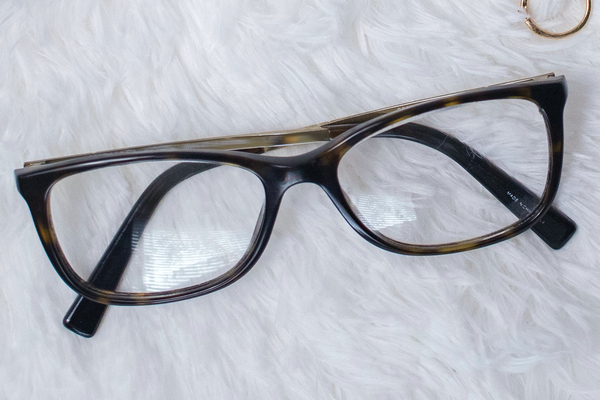

2. Stylish and sophisticated, these dark red leather shoes for women combine timeless elegance with walkable comfort for both work and special events.


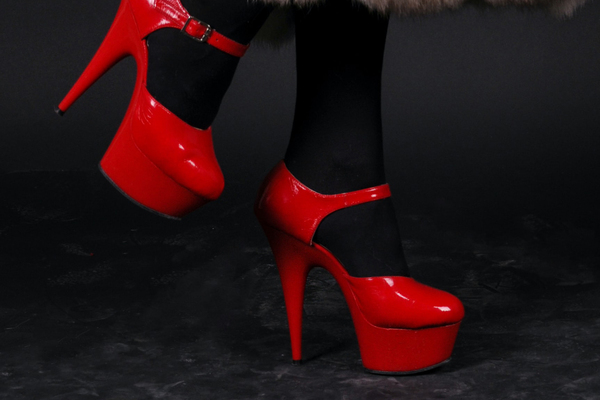

3. Elevate your summer style with these modish and elegant women's sandals. Featuring a sleek, fashionable design, these chic sandals promise all-day comfort and head-turning flair. The perfect footwear choice for warm weather ensembles.


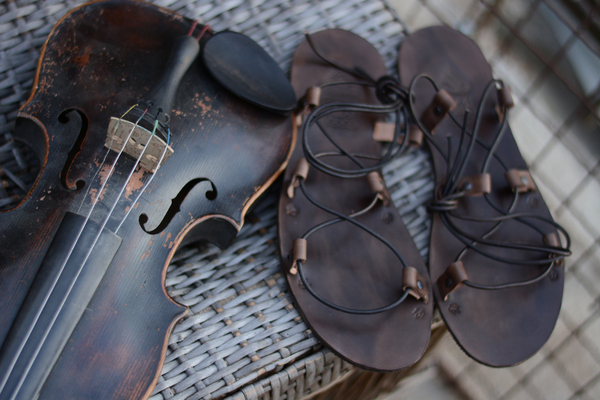

4. Sleek and sophisticated, these versatile black heels elongate legs and compliment any outfit. Crafted with quality leather and a cushioned insole, this elegantly stylish footwear provides all-day comfort and sophistication.


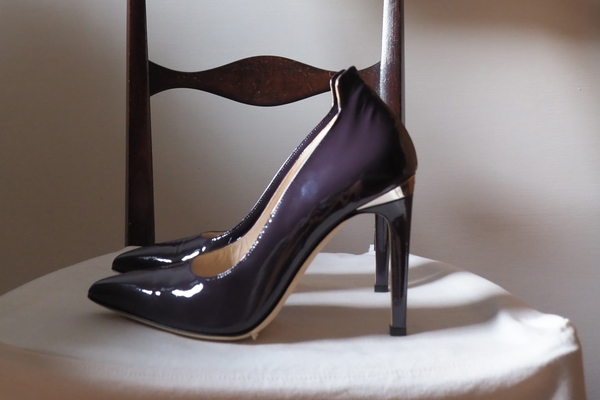

5. Presenting our finest leather boots, crafted with care to deliver superior comfort and timeless sophistication. These durable, sleek brown boots are designed to become your most trusted footwear for any occasion.


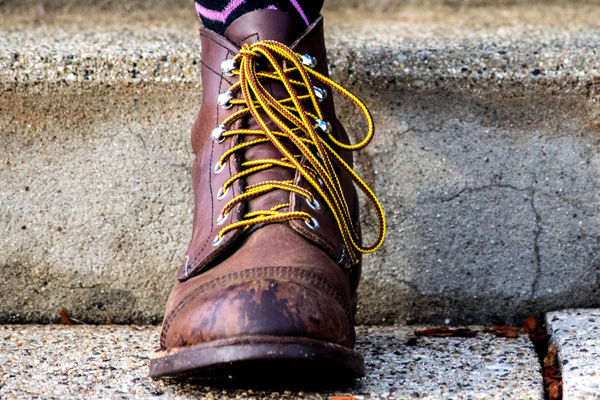

In [242]:
#Keyword Search
query = "trendy footwear for women"
url = 'https://' + host + "/bedrock-multimodal-demostore-search-index/_search"
keyword_payload = {"_source": {
        "exclude": [
            "vector_embedding"
        ]
        },
        "query": {    "match": {
                        "product_description": {
                            "query": query
                        }
                        }
                    }
        
        ,"size":5,
  }

r = requests.get(url, auth=awsauth, json=keyword_payload, headers=headers)
response_ = json.loads(r.text)
docs = response_['hits']['hits']

for i,doc in enumerate(docs):
    print(str(i+1)+ ". "+doc["_source"]["product_description"])
    image = Image.open(doc["_source"]["image_url"])
    image.show()

10. Experiment 2: Multimodal search with only text caption as input

Presenting the Thistle Purple Formal Shoes - an elegant, eye-catching pair featuring rich purple hues reminiscent of thistle flowers. With sleek styling perfect for both casual and formal wear, these lightweight women's shoes offer cushioned comfort and sophisticated style to complement any outfit.


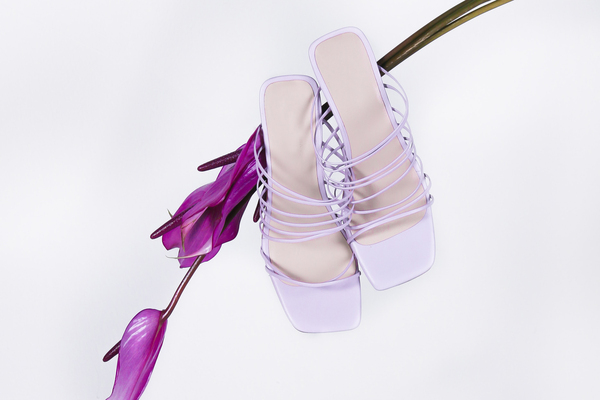

Exude poise and sophistication in these timeless black leather heels featuring a glossy finish, lace-up front, and modest heel for all-day comfort. The perfect polish for work and formal events.


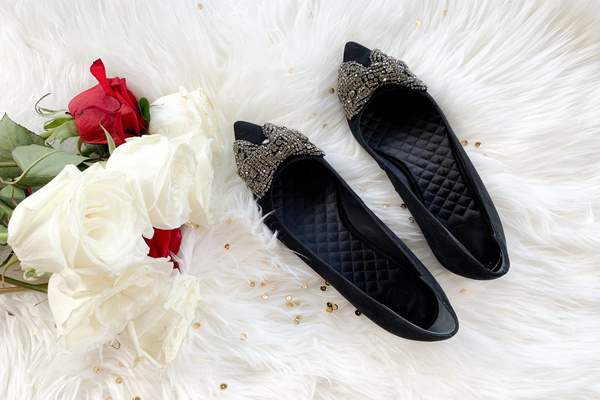

Make an elegant entrance in these dramatic 4-inch chunky-heeled platform pumps. Faux leather straps and cushioned footbed keep you comfortable while you dance the night away.


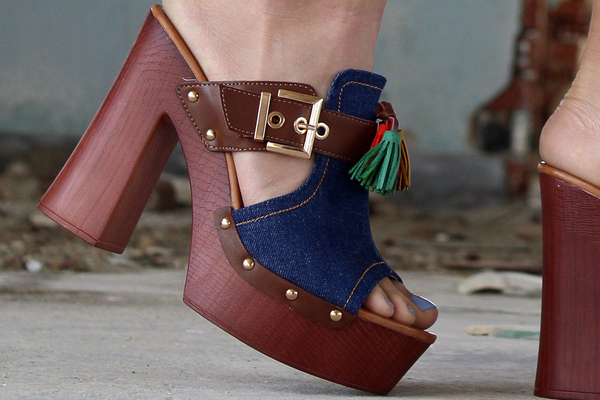

Show off sophisticated style in these elegant brown leather lace-up shoes. Crafted from rich leather with a sleek, polished finish, these versatile flats elevate any outfit with timeless feminine flair.


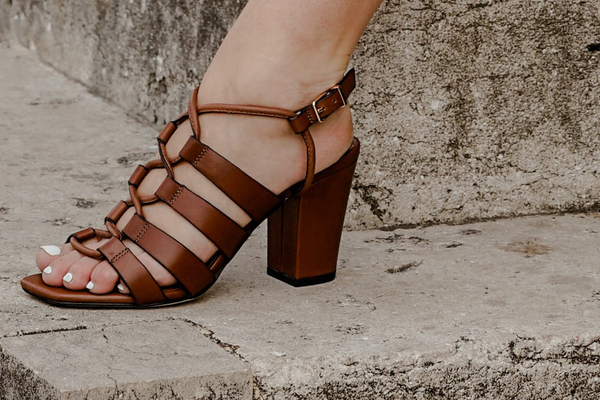

Make a bold fashion statement with these lightweight, open-toe Edgy Sandals. Their eye-catching silhouette and vibrant design complement any summer outfit, keeping your feet cool and stylish for all your warm weather adventures.


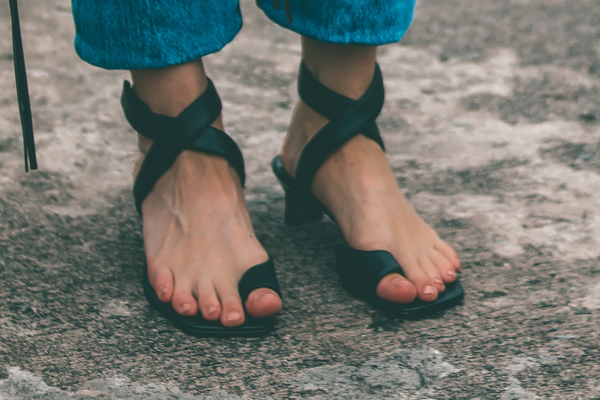

In [243]:
#Multimodal Search
#Text as input

query = "trendy footwear for women"
url = 'https://'+host+"/bedrock-multimodal-demostore-search-index/_search"
keyword_payload = {"_source": {
        "exclude": [
            "vector_embedding"
        ]
        },
        "query": {    
       
        "neural": {
            "vector_embedding": {
                
            #"query_image":query_image_binary,
            "query_text":query,
                
            "model_id": model_id,
            "k": 3
            }
            }
            
                    }
        
        ,"size":5,
  }

r = requests.get(url, auth=awsauth, json=keyword_payload, headers=headers)
response_ = json.loads(r.text)
docs = response_['hits']['hits']

for i,doc in enumerate(docs):
    print(doc["_source"]["product_description"])
    image = Image.open(doc["_source"]["image_url"])
    image.show()
   
    

11. Experiment 3: Multimodal search with only image as input

Input text query: trendy black footwear for women
Input query Image:


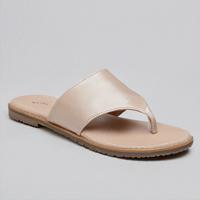

Slip into summer with these effortlessly stylish men's sandals! Featuring an open-toe design and adjustable straps for a custom fit, these lightweight sandals have a cushioned footbed and durable rubber sole for all-day comfort. The perfect versatile footwear for beating the heat in relaxed style.


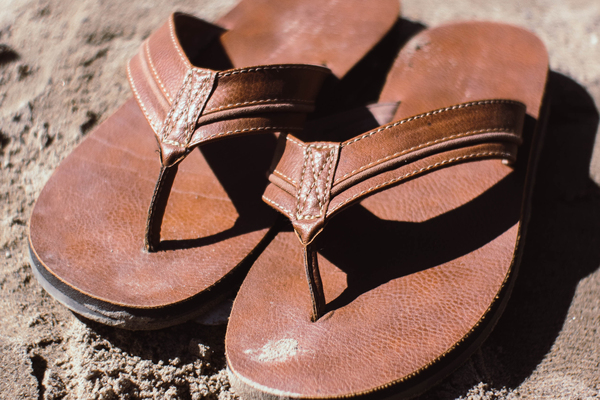

Rose gold stiletto heels featuring a sleek pointed toe and thin 4 inch heel. Crafted with smooth metallic faux leather uppers and a delicate ankle strap. Elegant for cocktail parties and formal events.


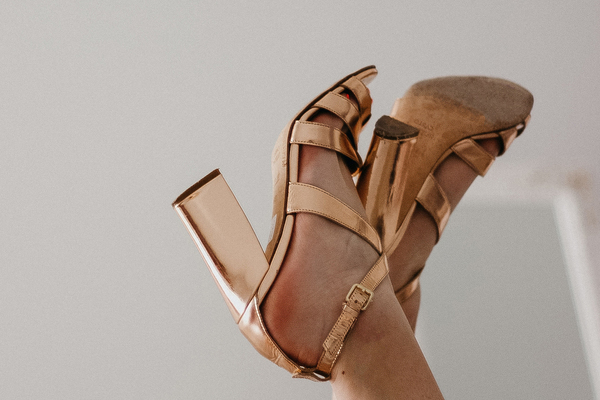

Expertly crafted leather sandals offering sophisticated style and all-day comfort. The open-toe design and contoured footbed provide a secure yet breathable fit, perfect for both casual and smart casual outfits.


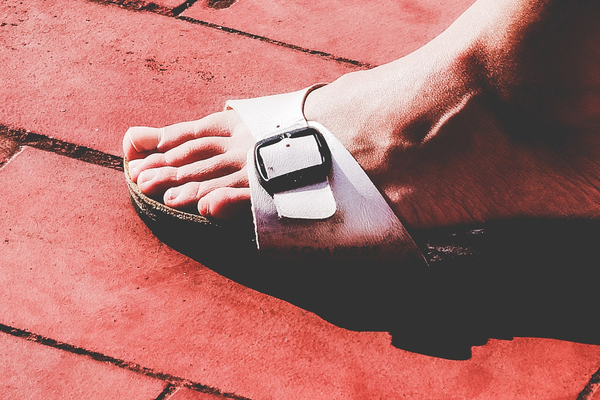

Presenting the Swanky Open-Toe Sandals - an elegant and stylish pair of women's sandals that will elevate your summer looks. Crafted with quality materials in a chic open-toe design, these lightweight sandals offer comfort and versatility for both daytime and evening wear. Add a touch of glamour to your wardrobe with these fashionable yet affordable sandals.


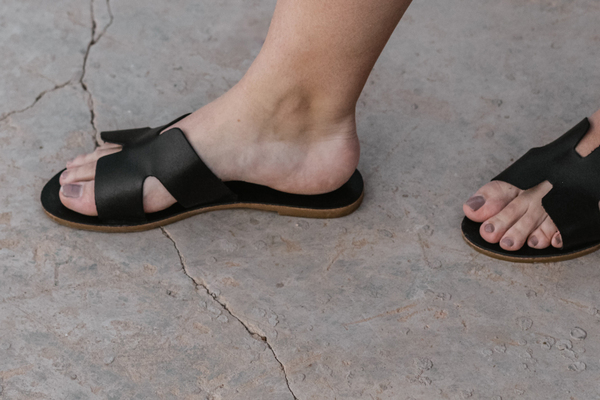

Sleek and sophisticated, these versatile nude pointed toe heels effortlessly elevate any outfit from day to night. Crafted with quality materials for comfort and style.


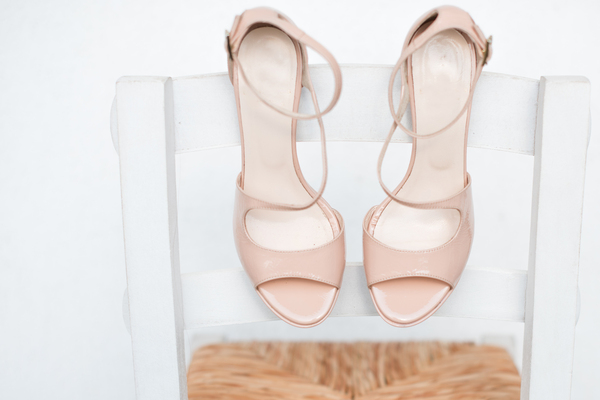

In [244]:
#Multimodal Search
#image as input
import urllib.request
s3 = boto3.client('s3')
url = 'https://'+host + "/bedrock-multimodal-demostore-search-index/_search"
query = "trendy black footwear for women"
print("Input text query: "+query)
# urllib.request.urlretrieve( 
#   'https://cdn.pixabay.com/photo/2014/09/03/20/15/shoes-434918_1280.jpg',"tmp/women-footwear.jpg") 
s3.download_file('ml-search-app-access','women_wear.jpg','tmp/women-footwear-1.jpg')
img = Image.open("tmp/women-footwear-1.jpg") 
print("Input query Image:")
img.show()
with open("tmp/women-footwear-1.jpg", "rb") as image_file:
    query_image_binary = base64.b64encode(image_file.read()).decode("utf8")
keyword_payload = {"_source": {
        "exclude": [
            "vector_embedding"
        ]
        },
        "query": {    
       
        "neural": {
            "vector_embedding": {
                
            "query_image":query_image_binary,
            "model_id": model_id,
            "k": 5
            }
            
            }
                    }
        
        ,"size":5,
  }

r = requests.get(url, auth=awsauth, json=keyword_payload, headers=headers)
response_ = json.loads(r.text)
docs = response_['hits']['hits']

for i,doc in enumerate(docs):
    print(doc["_source"]["product_description"])
    image = Image.open(doc["_source"]["image_url"])
    image.show()

12. Experiment 4: Multimodal search with both image and text caption as inputs

Input text query: trendy footwear for women
Input query Image:


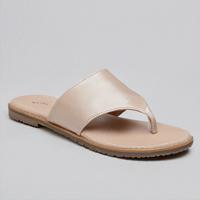

Presenting the Swanky Open-Toe Sandals - an elegant and stylish pair of women's sandals that will elevate your summer looks. Crafted with quality materials in a chic open-toe design, these lightweight sandals offer comfort and versatility for both daytime and evening wear. Add a touch of glamour to your wardrobe with these fashionable yet affordable sandals.


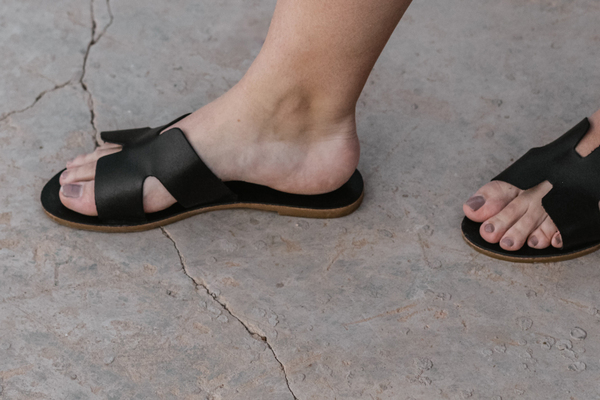

Sleek and sophisticated, these versatile nude pointed toe heels effortlessly elevate any outfit from day to night. Crafted with quality materials for comfort and style.


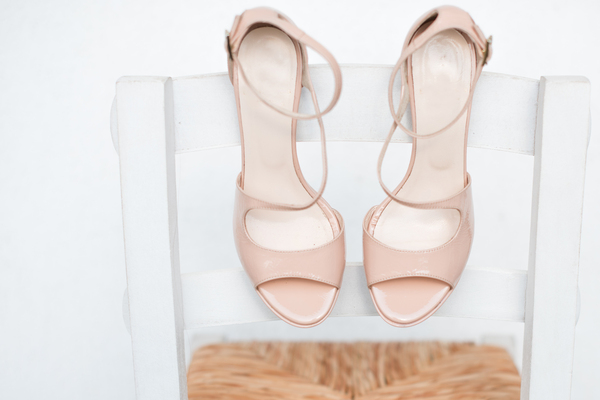

Make a stylish statement this summer with these fashionable women's sandals! Featuring a lightweight open design, footbed cushioning, and eye-catching colors, these versatile sandals are perfect for both daytime and evening wear.


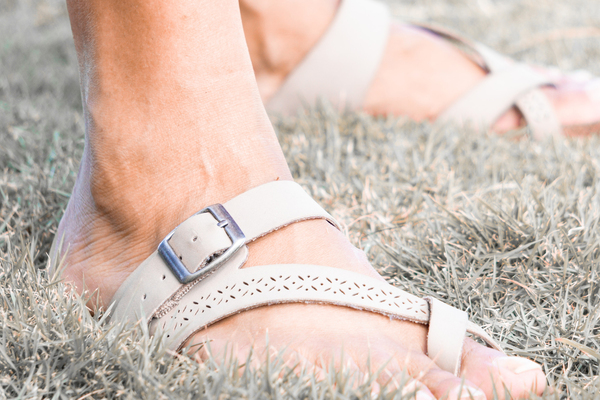

Expertly crafted leather sandals offering sophisticated style and all-day comfort. The open-toe design and contoured footbed provide a secure yet breathable fit, perfect for both casual and smart casual outfits.


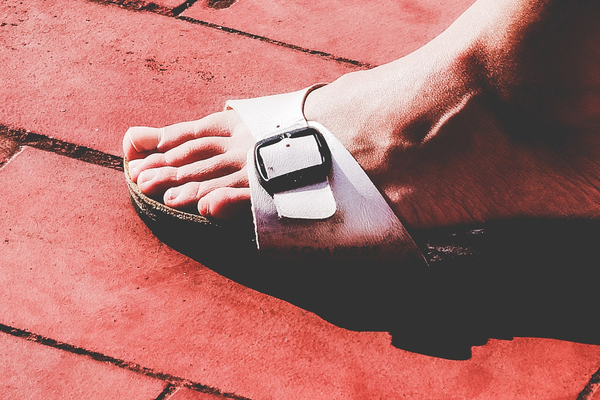

Rose gold stiletto heels featuring a sleek pointed toe and thin 4 inch heel. Crafted with smooth metallic faux leather uppers and a delicate ankle strap. Elegant for cocktail parties and formal events.


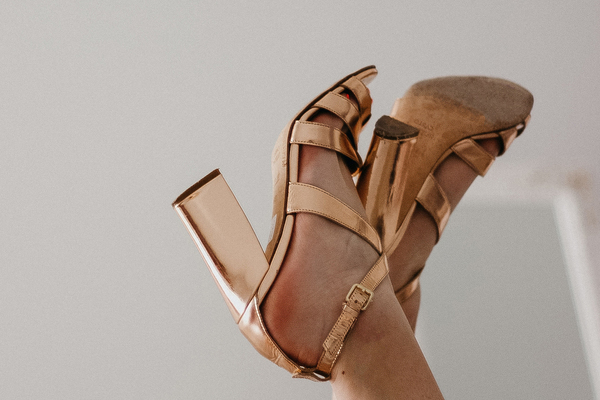

In [245]:
#Multimodal Search
#Text and image as inputs
import urllib.request
s3 = boto3.client('s3')
url = 'https://'+host + "/bedrock-multimodal-demostore-search-index/_search"
query = "trendy footwear for women"
print("Input text query: "+query)
# urllib.request.urlretrieve( 
#   'https://cdn.pixabay.com/photo/2014/09/03/20/15/shoes-434918_1280.jpg',"tmp/women-footwear.jpg") 
s3.download_file('ml-search-app-access','women_wear.jpg','tmp/women-footwear-1.jpg')
img = Image.open("tmp/women-footwear-1.jpg") 
print("Input query Image:")
img.show()
with open("tmp/women-footwear-1.jpg", "rb") as image_file:
    query_image_binary = base64.b64encode(image_file.read()).decode("utf8")
keyword_payload = {"_source": {
        "exclude": [
            "vector_embedding"
        ]
        },
        "query": {    
       
        "neural": {
            "vector_embedding": {
                
            "query_image":query_image_binary,
            "query_text":query,
                
            "model_id": model_id,
            "k": 5
            }
            
            }
                    }
        
        ,"size":5,
  }

r = requests.get(url, auth=awsauth, json=keyword_payload, headers=headers)
response_ = json.loads(r.text)
docs = response_['hits']['hits']

for i,doc in enumerate(docs):
    print(doc["_source"]["product_description"])
    image = Image.open(doc["_source"]["image_url"])
    image.show()